In [1]:
import warnings
warnings.filterwarnings('ignore')
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib as mpl
import cell2location
from matplotlib import rcParams
#https://github.com/BayraktarLab/cell2location/blob/master/docs/notebooks/cell2location_tutorial.ipynb

[rank: 0] Global seed set to 0
Package pickle5 becomes unnecessary in Python 3.8 and above. Its presence may confuse libraries including Ray. Please uninstall the package.


In [2]:
results_folder = '.'
# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

In [3]:
adata_vis = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata_vis.obs['sample'] = list(adata_vis.uns['spatial'].keys())[0]

In [4]:
adata_vis.var['SYMBOL'] = adata_vis.var_names
adata_vis.var.set_index('gene_ids', drop=True, inplace=True)

In [5]:
adata_ref = sc.read(
    f'./data/sc.h5ad', 
    backup_url='https://cell2location.cog.sanger.ac.uk/paper/integrated_lymphoid_organ_scrna/RegressionNBV4Torch_57covariates_73260cells_10237genes/sc.h5ad')

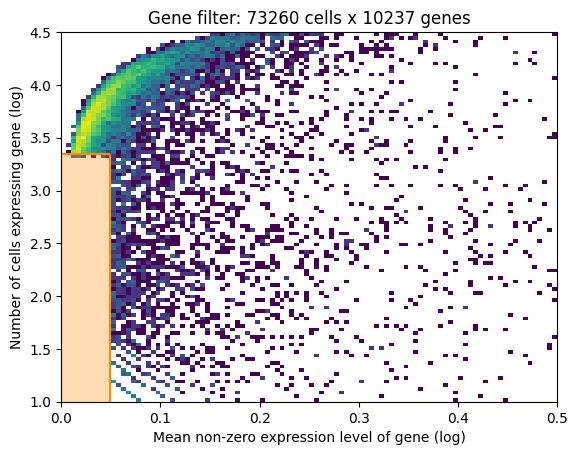

In [6]:
from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_ref, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
adata_ref = adata_ref[:, selected].copy()

In [7]:
adata_ref.var['SYMBOL'] = adata_ref.var.index 
adata_ref.var.set_index('GeneID-2', drop=True, inplace=True)
del adata_ref.raw

In [8]:
cell2location.models.RegressionModel.setup_anndata(
    adata = adata_ref, 
    batch_key = 'Sample', 
    labels_key = 'Subset', 
    categorical_covariate_keys = ['Method']
)

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [14]:
from cell2location.models import RegressionModel
mod = RegressionModel(adata_ref)
import torch
torch.set_float32_matmul_precision('medium')
# mod.view_anndata_setup()

In [15]:
mod.train(max_epochs=250, use_gpu=True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 250/250: 100%|██████████| 250/250 [2:20:33<00:00, 35.55s/it, v_num=1, elbo_train=2.88e+8]  

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|██████████| 250/250 [2:20:33<00:00, 33.73s/it, v_num=1, elbo_train=2.88e+8]


In [16]:
adata_ref = mod.export_posterior(
    adata_ref, sample_kwargs={'num_samples': 1000, 'batch_size': 2500, 'use_gpu': True}
)
mod.save(f"{ref_run_name}", overwrite=True)
adata_file = f"{ref_run_name}/tonsil_gex.h5ad"
adata_ref.write(adata_file)
adata_file

Sampling global variables, sample: 100%|██████████| 999/999 [00:43<00:00, 22.81it/s]


'./reference_signatures/tonsil_gex.h5ad'

In [17]:
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}' 
        for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}' 
        for i in adata_ref.uns['mod']['factor_names']]].copy()
    
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.iloc[0:5, 0:5]

,B_Cycling,B_GC_DZ,B_GC_LZ,B_GC_prePB,B_IFN
GeneID-2,,,,,
ENSG00000188976,0.432773,0.244225,0.311754,0.348340,0.153428
ENSG00000188290,0.002271,0.000674,0.000703,0.052347,0.042939
ENSG00000187608,0.390619,0.215354,0.276240,0.498880,3.927300
ENSG00000186891,0.020597,0.000837,0.056568,0.070414,0.009305
ENSG00000186827,0.007759,0.000574,0.006540,0.031522,0.010890


In [18]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_vis, batch_key="sample")

In [19]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver, 
    # the expected average cell abundance: tissue-dependent 
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=30,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20
) 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 30000/30000: 100%|██████████| 30000/30000 [3:22:28<00:00,  2.69it/s, v_num=1, elbo_train=4.54e+7]  

`Trainer.fit` stopped: `max_epochs=30000` reached.


Epoch 30000/30000: 100%|██████████| 30000/30000 [3:22:28<00:00,  2.47it/s, v_num=1, elbo_train=4.54e+7]


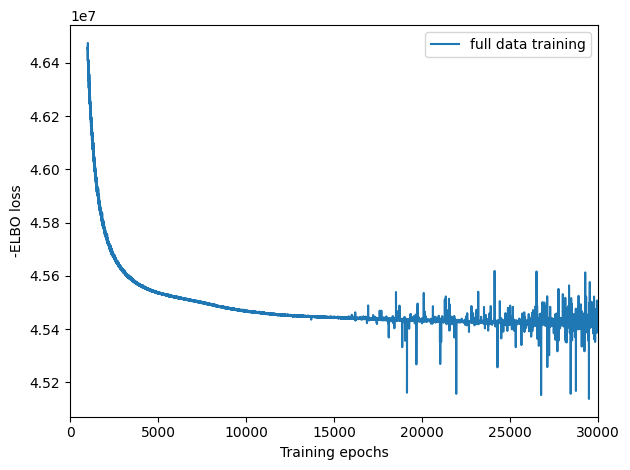

In [20]:
mod.train(max_epochs=30000, 
          # train using full data (batch_size=None)
          batch_size=None, 
          # use all data points in training because 
          # we need to estimate cell abundance at all locations
          train_size=1,
          use_gpu=True,
         )

# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

In [21]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu': True}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{run_name}/tonsil_1.h5ad"
adata_vis.write(adata_file)
adata_file

Sampling global variables, sample: 100%|██████████| 999/999 [03:34<00:00,  4.67it/s]


'./cell2location_map/tonsil_1.h5ad'

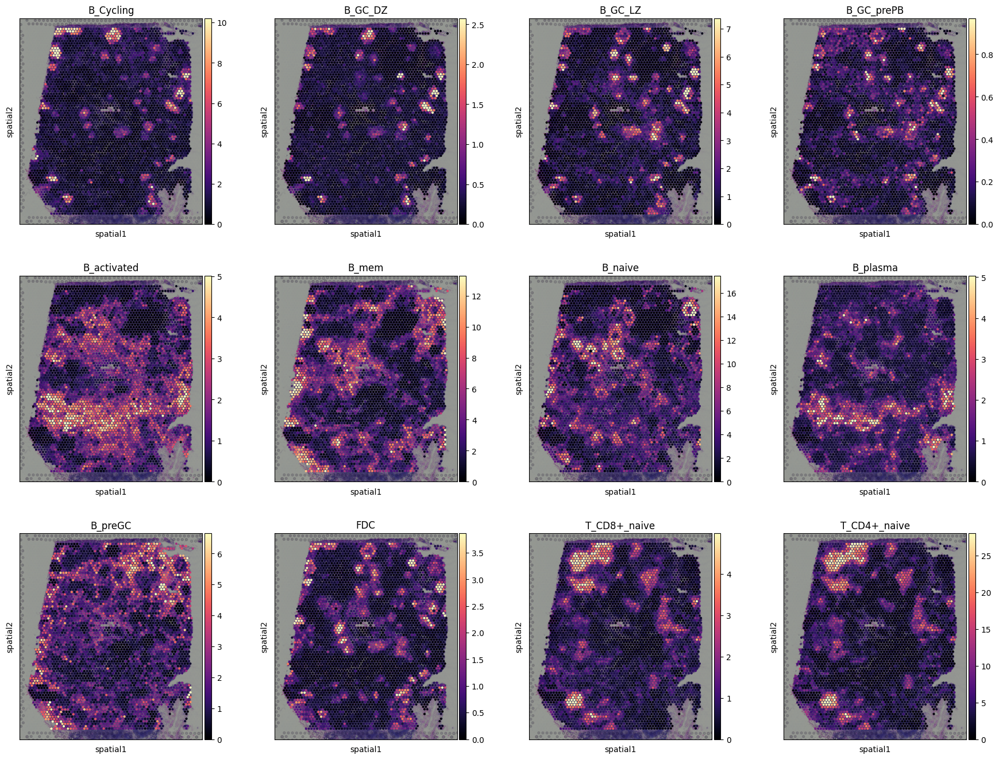

In [39]:
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

# select one slide
from cell2location.utils import select_slide
slide = select_slide(adata_vis, adata_vis.obs['sample'].unique()[0])
    
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):
    
    sc.pl.spatial(slide, cmap='magma',
                  # show first 8 cell types
                  color=['B_Cycling', 'B_GC_DZ', 'B_GC_LZ', 'B_GC_prePB', 
                         'B_activated', 'B_mem', 'B_naive', 'B_plasma', 
                         'B_preGC', 'FDC', 'T_CD8+_naive', 'T_CD4+_naive'], 
                  ncols=4, size=1.3, 
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2' 
                 )

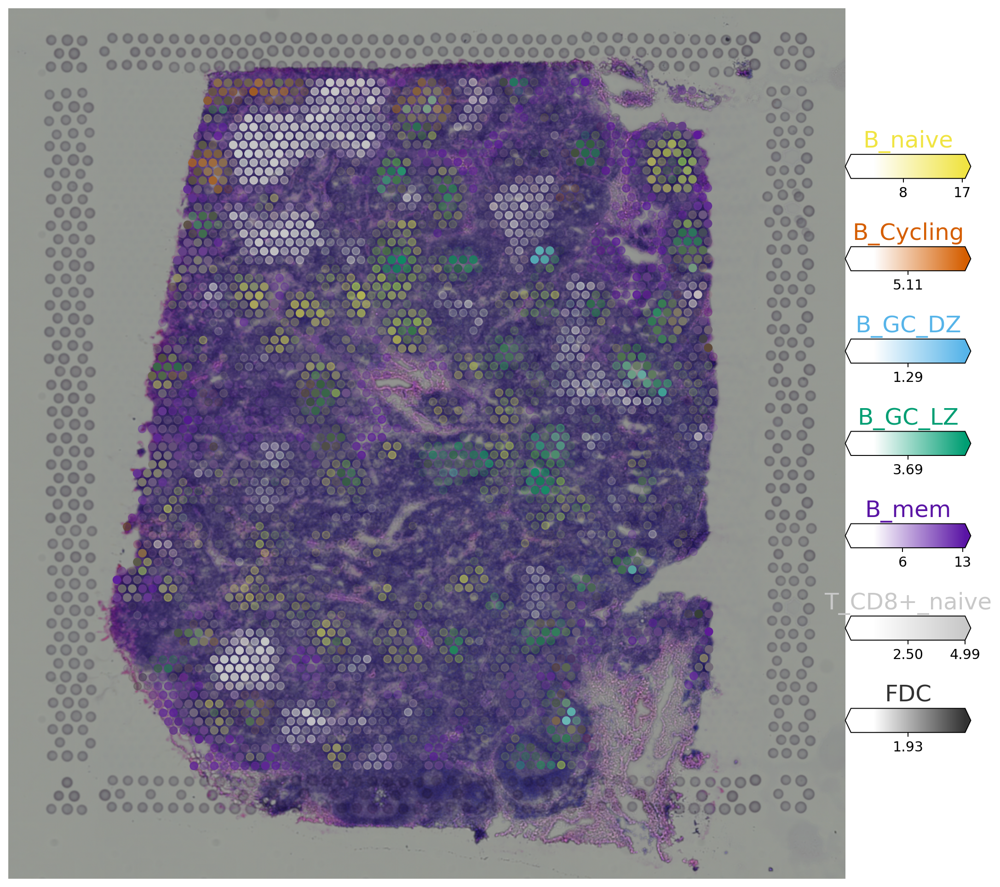

In [50]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters 
clust_labels = ['B_naive', 'B_Cycling', 'B_GC_DZ', 'B_GC_LZ', 'B_mem', 'T_CD8+_naive', 'FDC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_vis, 'V1_Human_Lymph_Node')

with mpl.rc_context({'figure.figsize': (15, 15), 'figure.dpi': 180}):
    fig = plot_spatial(
        adata=slide, 
        # labels to show on a plot
        color=clust_col, labels=clust_labels, 
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast', 
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6.5, 
        colorbar_position='right'
    )

In [54]:
from cell2location import run_colocation
res_dict, adata_vis = run_colocation(
    adata_vis,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5, 20), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 5 # number of training restarts
    },
    # the hyperparameters of NMF can be also adjusted:
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.000001}},
    export_args={'path': '/tmp/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_7combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_8combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_9combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_10combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_13combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_14combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_15combinations_4035locations_34factors
### Analysis name: CoLocatedGroupsSklearnNMF_16combinations_4035locations_34facto

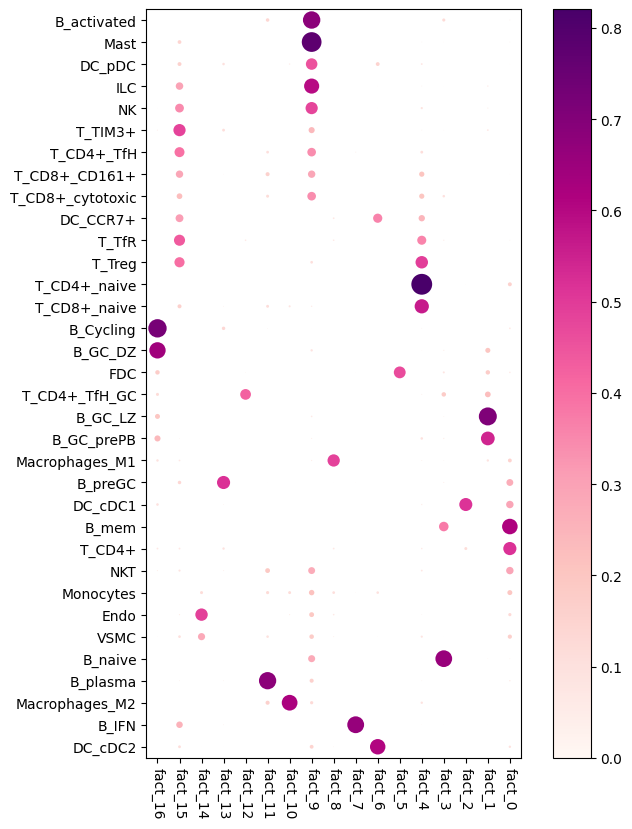

In [56]:
res_dict['n_fact17']['mod'].plot_cell_type_loadings()

In [48]:
import squidpy as sq

In [51]:
df = adata_vis.obs[['B_Cycling', 'B_GC_DZ', 'B_GC_LZ',
       'B_GC_prePB', 'B_activated', 'B_mem', 'T_CD8+_naive', 'B_naive', 'B_plasma',
       'B_preGC', 'FDC', 'T_CD4+_naive']]

adata_vis.obs['celltype'] = df.iloc[:, :].idxmax(axis=1).values
# adata_vis.obs['celltype'] = df.div(df.sum(0)).iloc[:, :].idxmax(axis=1).values
adata_vis.obs['celltype'] = adata_vis.obs['celltype'].astype('category')

In [52]:
adata_vis.obs['celltype'].value_counts()

B_naive         1292
T_CD4+_naive    1153
B_mem            774
B_Cycling        201
B_preGC          187
B_activated      164
B_plasma         133
B_GC_LZ          129
FDC                2
Name: celltype, dtype: int64

In [4]:
tissue = 'Tonsil'
adata = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX')
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
adt_ref = pd.read_csv('/ix/hosmanbeyoglu/kor11/CytAssist/Brain/GEX_PEX/CytAssist_FFPE_Protein_Expression_Human_Glioblastoma_feature_reference.csv')
pdata = adata[:, [i in adt_ref[adt_ref.isotype_control==False].id.values for i in adata.var_names]]
adata = adata[:, [i not in adt_ref[adt_ref.isotype_control==False].id.values and 'MT-' not in i for i in adata.var_names]]
pdata.var.feature_types = 'Antibody Capture'
adata.layers['counts'] = adata.X
pdata.layers['counts'] = pdata.X
adata.var_names_make_unique()
adata.shape

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


(4194, 18046)

In [5]:
adata2 = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX')
adata2.obsm['spatial'] = adata2.obsm['spatial'].astype(float)
adata2.layers['counts'] = adata2.X
adata2.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [6]:
# plt.rcParams['figure.figsize'] = [10, 10]

# sq.pl.spatial_scatter(adata, color=['kmeans'], size=1.5, 
#                       edgecolor='black', linewidth=0.5, frameon=False, 
#                       alpha=1, img=True, shape='circle', palette='Dark2',
#                       figsize=(10, 10), 
#                       dpi=100)
# plt.show()

In [7]:
import uniport as up

In [8]:
adata.obs['source'] = 'CytAssist'
adata.obs['domain_id'] = 0
adata.obs['domain_id'] = adata.obs['domain_id'].astype('category')
adata2.obs['source'] = '10X'
adata2.obs['domain_id'] = 1
adata2.obs['domain_id'] = adata2.obs['domain_id'].astype('category')
adata_cm = adata.concatenate(adata2, join='inner', batch_key='domain_id')

In [9]:
sc.pp.normalize_total(adata_cm)
sc.pp.log1p(adata_cm)
sc.pp.highly_variable_genes(adata_cm, n_top_genes=2000, inplace=False, subset=True)
up.batch_scale(adata_cm)

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, inplace=False, subset=True)
up.batch_scale(adata)

sc.pp.normalize_total(adata2)
sc.pp.log1p(adata2)
sc.pp.highly_variable_genes(adata2, n_top_genes=2000, inplace=False, subset=True)
up.batch_scale(adata2)

In [10]:
# integration with both common and dataset-specific genes
# latent representation are stored in adata.obs['latent']
adata = up.Run(adatas=[adata, adata2], adata_cm=adata_cm, lambda_s=1.0)

Device: cuda
Dataset 0: CytAssist
AnnData object with n_obs × n_vars = 4194 × 2000
    obs: 'in_tissue', 'array_row', 'array_col', 'source', 'domain_id'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg'
    obsm: 'spatial'
    layers: 'counts'
Dataset 1: 10X
AnnData object with n_obs × n_vars = 4035 × 2000
    obs: 'in_tissue', 'array_row', 'array_col', 'source', 'domain_id'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg'
    obsm: 'spatial'
    layers: 'counts'
Reference dataset is dataset 1


Data with common HVG
AnnData object with n_obs × n_vars = 8229 × 2000
    obs: 'in_tissue', 'array_row', 'array_col', 'source', 'domain_id'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    obsm: 'spatial'
    layers: 'c

Epochs: 100%|██████████| 938/938 [21:23<00:00,  1.37s/it, recloss=1693.93,klloss=8.13,otloss=9.04] 


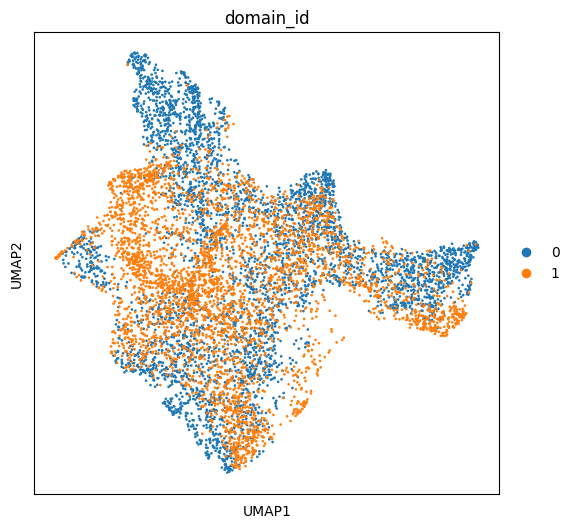

In [55]:
sc.pp.neighbors(adata, use_rep='latent')
sc.tl.umap(adata, min_dist=0.2)
sc.pl.umap(adata, color=['source'])

In [40]:
import cuml

In [93]:
adata.var.sort_values(by='dispersions', ascending=False)

,gene_ids,feature_types,genome,highly_variable,means,dispersions,dispersions_norm
IGKC,ENSG00000211592,Gene Expression,GRCh38,True,6.904080,6.937480,1.000000
SLC16A11,ENSG00000174326,Gene Expression,GRCh38,True,0.235638,6.481028,17.360518
S100A8,ENSG00000143546,Gene Expression,GRCh38,True,3.702088,6.077715,1.880593
CXCL8,ENSG00000169429,Gene Expression,GRCh38,True,0.591170,5.451599,11.903173
RASSF7,ENSG00000099849,Gene Expression,GRCh38,True,0.702618,5.149882,11.548217
...,...,...,...,...,...,...,...
ACTC1,ENSG00000159251,Gene Expression,GRCh38,True,0.020590,0.441701,0.849988
STRADB,ENSG00000082146,Gene Expression,GRCh38,True,0.327672,0.441113,0.848381
HOXB9,ENSG00000170689,Gene Expression,GRCh38,True,0.029727,0.441058,0.848230
MMACHC,ENSG00000132763,Gene Expression,GRCh38,True,0.202641,0.440464,0.846608


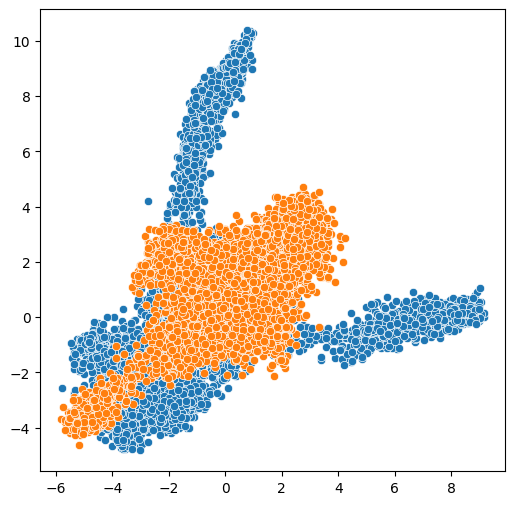

In [119]:
plt.rcParams['figure.figsize'] = [6, 6]

for ii in [0, 1]:
    data = adata[adata.obs.domain_id==f'{ii}']
    red = cuml.UMAP(
        n_components=2,
        n_neighbors=20,
        min_dist=0.1,
        random_state=42
    )
    red.fit(data.X.toarray())
    plot_data = red.transform(data.X.toarray())
    cmap =  ListedColormap(sns.color_palette("husl", 256).as_hex())
    sns.scatterplot(plot_data[:, 0], plot_data[:, 1])

plt.show()

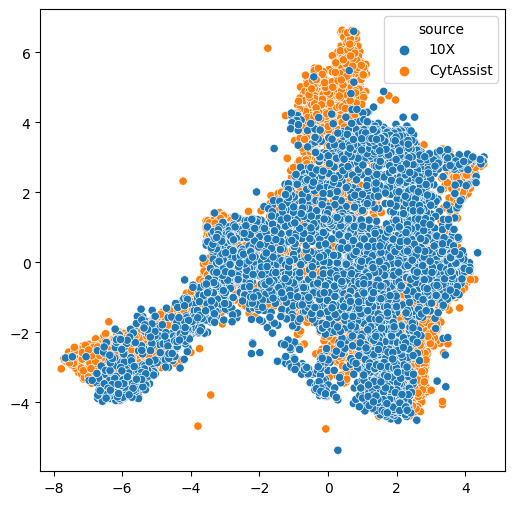

In [122]:
plt.rcParams['figure.figsize'] = [6, 6]
red = cuml.UMAP(
    n_components=2,
    n_neighbors=20,
    min_dist=.1,
    random_state=42
)
red.fit(adata.obsm['latent'])
plot_data = red.transform(adata.obsm['latent'])
sns.scatterplot(plot_data[:, 0], plot_data[:, 1], hue=adata.obs.source)
plt.show()

In [110]:
adata.obs

,in_tissue,array_row,array_col,source,domain_id
AACACGTGCATCGCAC-1-0,1,76,22,CytAssist,0
AACACTTGGCAAGGAA-1-0,1,47,71,CytAssist,0
AACAGGAAGAGCATAG-1-0,1,69,7,CytAssist,0
AACAGGATTCATAGTT-1-0,1,49,43,CytAssist,0
AACAGGCCAACGATTA-1-0,1,71,127,CytAssist,0
...,...,...,...,...,...
TTGTTTCACATCCAGG-1-1,1,58,42,10X,1
TTGTTTCATTAGTCTA-1-1,1,60,30,10X,1
TTGTTTCCATACAACT-1-1,1,45,27,10X,1
TTGTTTGTATTACACG-1-1,1,73,41,10X,1


In [ ]:
adata = up.Run(adata_cm=adata_cm)

In [4]:
sc.pp.filter_genes(adata, min_counts=5)
pdata.obsm['spatial'] = adata.obsm['spatial']
pdata.raw = pdata
pdata.X = pdata.X.astype(float)
data11 = adata.X.toarray()
data12 = pdata.X.toarray()
sc.tl.pca(pdata)
sc.pp.neighbors(pdata)
sc.tl.leiden(pdata, resolution=0.3)
type1 = pdata.obs.leiden.values
type2 = pdata.obs.leiden.values

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [5]:
gex = featurize(adata)
pex = featurize(pdata, clr=False)
d11, d12 = gex.features.cpu().numpy(), pex.features.cpu().numpy()
corr = torch.eye(d11.shape[0], d12.shape[0]).cuda()
d11.shape, d12.shape

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


((4194, 18003), (4194, 28))

In [6]:
adata.X = d11
sc.pp.highly_variable_genes(adata, n_top_genes=5000, flavor='cell_ranger', subset=True)
sc.pp.pca(adata)

In [7]:
d11 = adata.X
d12 = d12

In [8]:
d11.shape, d12.shape

((4194, 5000), (4194, 28))

In [9]:
d11 = torch.tensor(d11).cuda()
d12 = torch.tensor(d12).cuda()

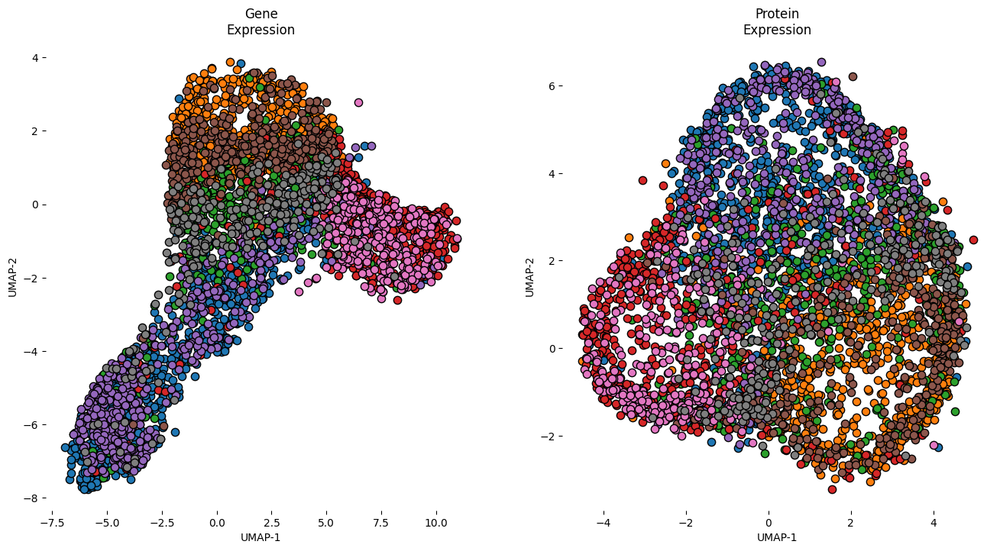

In [11]:
xyp, xyg = plot_latent([d11.cpu().numpy(), d12.cpu().numpy()], [type1, type2], 
            separate_dim=True, save=None);

In [12]:
def sparse_mx_to_torch_edge_list(sparse_mx):
    sparse_mx = sparse_mx.tocoo().astype(np.float32)
    edge_list = torch.from_numpy(
        np.vstack((sparse_mx.row, sparse_mx.col)).astype(np.int64))
    return edge_list

In [13]:
from modules.losses import Metrics, MultiTaskLoss
from modules.vae_infomax import InfoMaxVAE
# from modules.grace import GRACE, Encoder
# import torch.nn.functional as F
# from torch_geometric.utils import dropout_adj
# from torch_geometric.nn import GCNConv, DeepGraphInfomax

In [78]:
model = InfoMaxVAE([d11.shape[1], d12.shape[1]], latent_dim=32, encoder_dim=32).cuda()
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay=0)
epochs = 2500
loss_func = Loss(max_epochs=epochs)
metrics = Metrics()
loss_func.alpha = {
    'kl_gex': 2e-6,
    'kl_pex': 2e-6,
    'recons_gex': 1e2,
    'recons_pex': 1e2,
    'cosine_gex': 1e-1,
    'cosine_pex': 1e-1,
    'consistency': 0,
    'adj': 1e-3,
    'spatial': 0,
    'alignment': 0,
    'balance': 0,
    'cross': 0,
    'mutual_gex': 1e-3,
    'mutual_pex': 1e-3    
}

In [79]:
losses = []
embeds = []
feats = d11[:, :].data.cpu().numpy()
feats2 = d12[:, :].data.cpu().numpy()
dist = []

with tqdm(total=epochs) as pbar:
    for e in range(epochs):
            
        model.train()
        optimizer.zero_grad()
        A = gex.adj_norm.to_dense()
        output = model(X=[d11, d12], A=A)
        output.epochs = epochs
        output.adj_label = gex.adj_label
        output.pos_weight = gex.pos_weight
        output.gex_sp_dist = gex.sp_dists
        output.corr = gex.adj_label
        output.norm = gex.norm
        
        buffer = loss_func.compute(e, output)
        loss = metrics(buffer).sum()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
        optimizer.step()
        losses.append(float(loss))

        
        model.eval()
        pex_recons = output.pex_recons.data.cpu().numpy()
        pex_cor_mean = np.mean([spearmanr(feats2[:200, ixs], pex_recons[:200, ixs]).statistic for ixs in range(pex_recons.shape[1])])
        metrics.update_value('pex_corr', pex_cor_mean)
        
        proteins = model.swap_latent(d11, A)
        oracle_corr = np.mean([spearmanr(feats2[:, ixs], proteins[:, ixs]).statistic for ixs in range(proteins.shape[1])])
        metrics.update_value('oracle', oracle_corr)

        # integrated_data =  model(X=[d11, d12], A=A)
        # gex_z = integrated_data.gex_z.data.cpu().numpy()
        # pex_z = integrated_data.pex_z.data.cpu().numpy()
        # a, b = plot_latent([gex_z, pex_z], [type1, type2], reduce_only=True, save=f'/ix/hosmanbeyoglu/kor11/embeddings/{e}.png', fmt='png');
        # dist = np.mean([euclidean_distance(ai, bi) for ai, bi in zip(a, b)])
        # metrics.update_value('dist', dist)  
            
        pbar.update()        
        pbar.set_description(f'Oracle: {metrics.means.oracle:.3f} | Loss: {np.mean(metrics.losses):.3g} | PEX: {np.mean(metrics.means.pex_corr):.3f}')        
        # pbar.set_description(f'Loss: {np.mean(metrics.losses):.3f}')        

Oracle: 0.557 | Loss: 5.34 | PEX: 0.540: 100%|██████████| 2500/2500 [16:30<00:00,  2.52it/s]


In [212]:
model.eval()
A = gex.adj_norm.to_dense()
integrated_data =  model(X=[d11, d12], A=A)
gex_z = integrated_data.gex_z.data.cpu().numpy()
pex_z = integrated_data.pex_z.data.cpu().numpy()

In [213]:
from plotting import plot_latent

In [266]:
a, b = plot_latent([gex_z, pex_z], [type1, type2], 
            ['Gene\nEmbedding', 'Protein\nEmbedding'], 
            legend=False, method='umap', n_components=3, reduce_only=True,
            separate_dim=False, save=None);

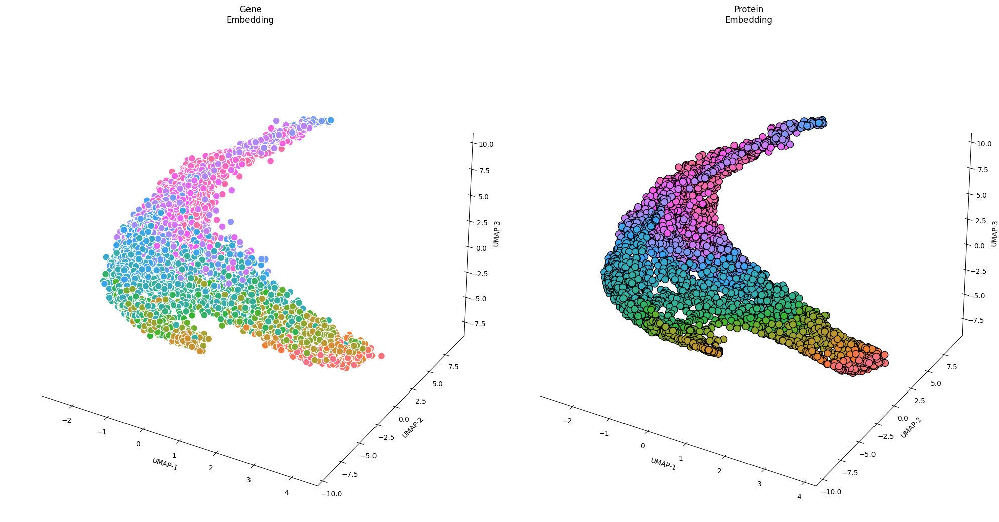

In [267]:

xa = a[:, 0] 
ya = a[:, 1] 
za = a[:, 2] 

xb = b[:, 0] 
yb = b[:, 1] 
zb = b[:, 2] 

# fig = plt.figure(figsize=(10, 10))
# ax = Axes3D(fig, auto_add_to_figure=False)
# fig.add_axes(ax)


# Create a figure
fig = plt.figure(figsize=(20, 20))

ax1 = fig.add_subplot(121, projection='3d')  # 121 means 1 row, 2 columns, first plot
ax2 = fig.add_subplot(122, projection='3d')  # 122 means 1 row, 2 columns, second plot

cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())

ax1.scatter(xa, ya, za, s=100, c=x, marker='o', cmap=cmap, alpha=1, edgecolors='white')
ax2.scatter(xb, yb, zb, s=100, c=x, marker='o', cmap=cmap, alpha=1, edgecolors='black')

ax1.set_xlabel('UMAP-1')
ax1.set_ylabel('UMAP-2')
ax1.set_zlabel('UMAP-3')

# Get rid of the panes                          
ax1.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0)) 
ax1.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0)) 
ax1.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0)) 


ax2.set_xlabel('UMAP-1')
ax2.set_ylabel('UMAP-2')
ax2.set_zlabel('UMAP-3')

ax2.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0)) 
ax2.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0)) 
ax2.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0)) 

ax1.set_title('Gene\nEmbedding')
ax2.set_title('Protein\nEmbedding')

ax1.grid(False)
ax2.grid(False)
plt.tight_layout()
plt.show()

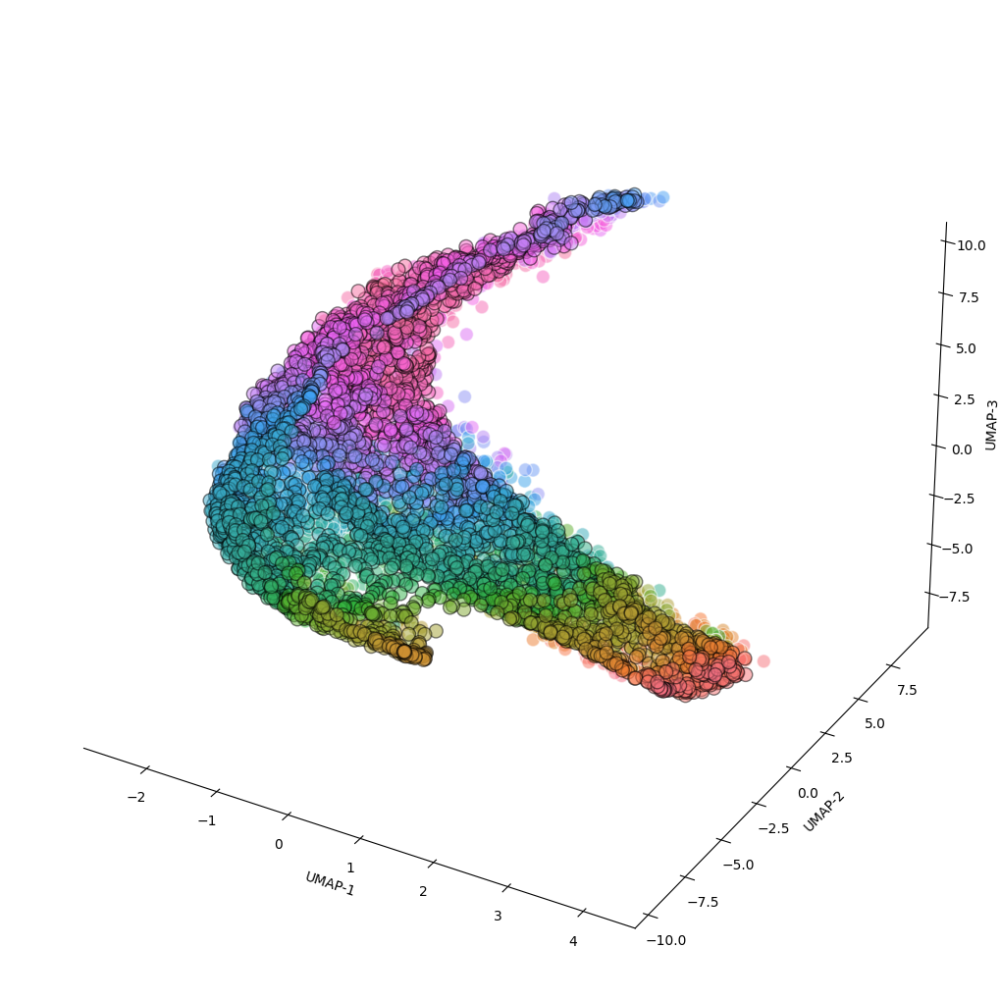

In [268]:
import re, seaborn as sns
import numpy as np

from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

xa = a[:, 0] 
ya = a[:, 1] 
za = a[:, 2] 

xb = b[:, 0] 
yb = b[:, 1] 
zb = b[:, 2] 

fig = plt.figure(figsize=(10, 10))
ax1 = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax1)

cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())

ax1.scatter(xa, ya, za, s=100, c=x, marker='o', cmap=cmap, alpha=0.5, edgecolors='white', antialiased=True)
ax1.scatter(xb, yb, zb, s=100, c=x, marker='o', cmap=cmap, alpha=0.5, edgecolors='black', antialiased=True)

ax1.set_xlabel('UMAP-1')
ax1.set_ylabel('UMAP-2')
ax1.set_zlabel('UMAP-3')

ax1.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0)) 
ax1.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0)) 
ax1.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0)) 


ax1.grid(False)

plt.show()

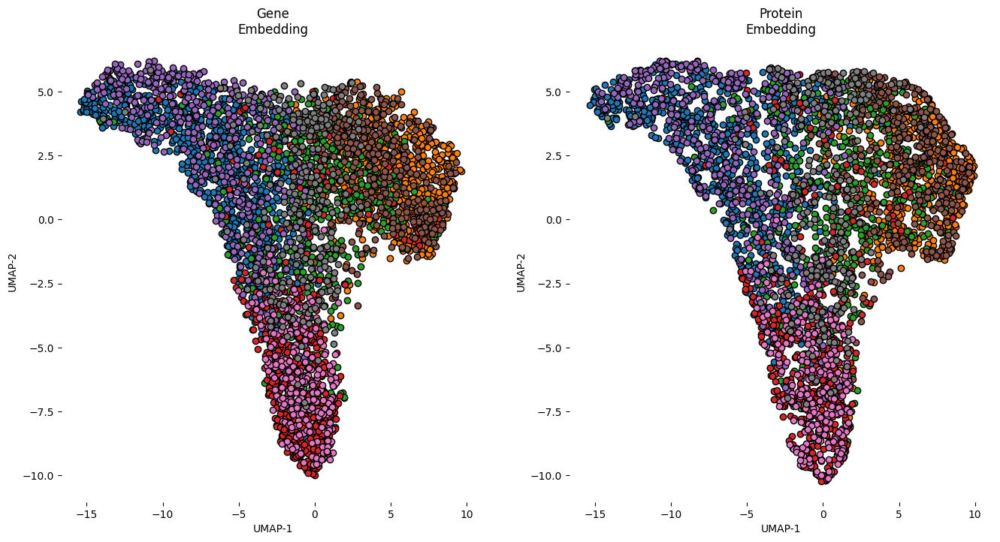

In [269]:
a, b = plot_latent([gex_z, pex_z], [type1, type2], 
            ['Gene\nEmbedding', 'Protein\nEmbedding'], 
            legend=False, method='umap',
            separate_dim=False, save=None);

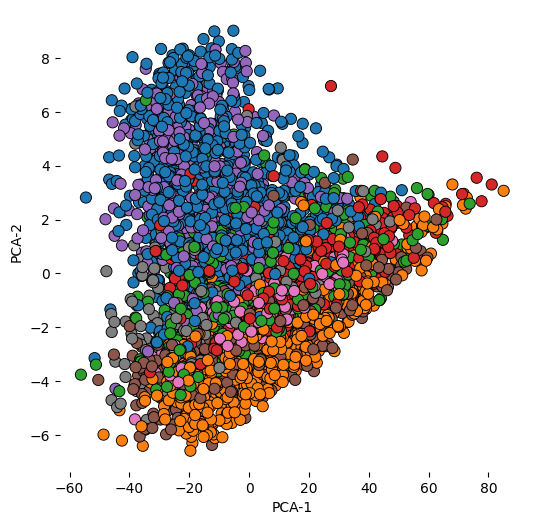

In [82]:
model.eval()
edge_index = A.nonzero().t().contiguous()
encoded, neg_z, summary = model.encoders[0](d11, edge_index)
encoded = encoded.detach().cpu().numpy()
z = np.random.multivariate_normal([0]*2, np.eye(2), len(type1))
xy = PCA(2).fit_transform(encoded)
plt.rcParams['figure.figsize'] = [6, 6]

sns.scatterplot(x=z[:, 0], y=z[:, 1], color='grey', alpha=0.2, s=70)
sns.scatterplot(x=xy[:, 0], y=xy[:, 1], hue=type1, edgecolor='black', s=65, legend=False)
sns.despine(left=True, bottom=True, trim=True, offset=10)
plt.xlabel('PCA-1')
plt.ylabel('PCA-2')
plt.show()

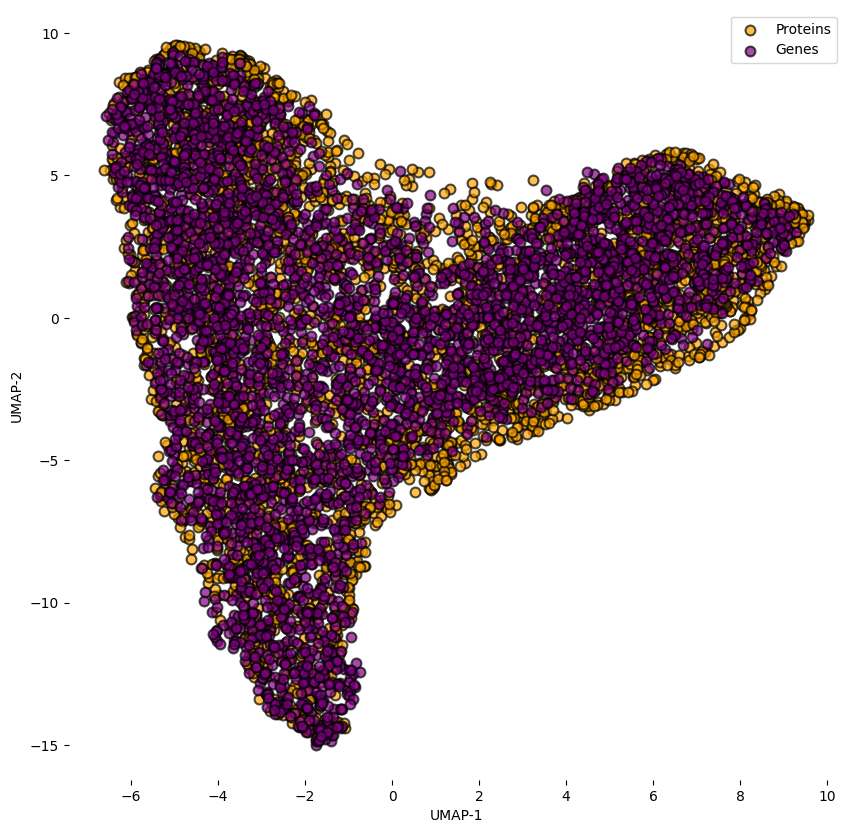

In [83]:
plt.rcParams['figure.figsize'] = [10, 10]
c1 = 'purple'
c2 = 'orange'
sns.scatterplot(b[:, 0], b[:, 1], label='Proteins', color=c2, s=50, alpha=0.7, edgecolor='black', linewidth=1.5)
sns.scatterplot(a[:, 0], a[:, 1], label='Genes', color=c1, s=50, alpha=0.7, edgecolor='black', linewidth=1.5)
plt.legend()
plt.box(False)
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
# plt.savefig('figures/overlap.svg', format='svg', dpi=180)
plt.show()

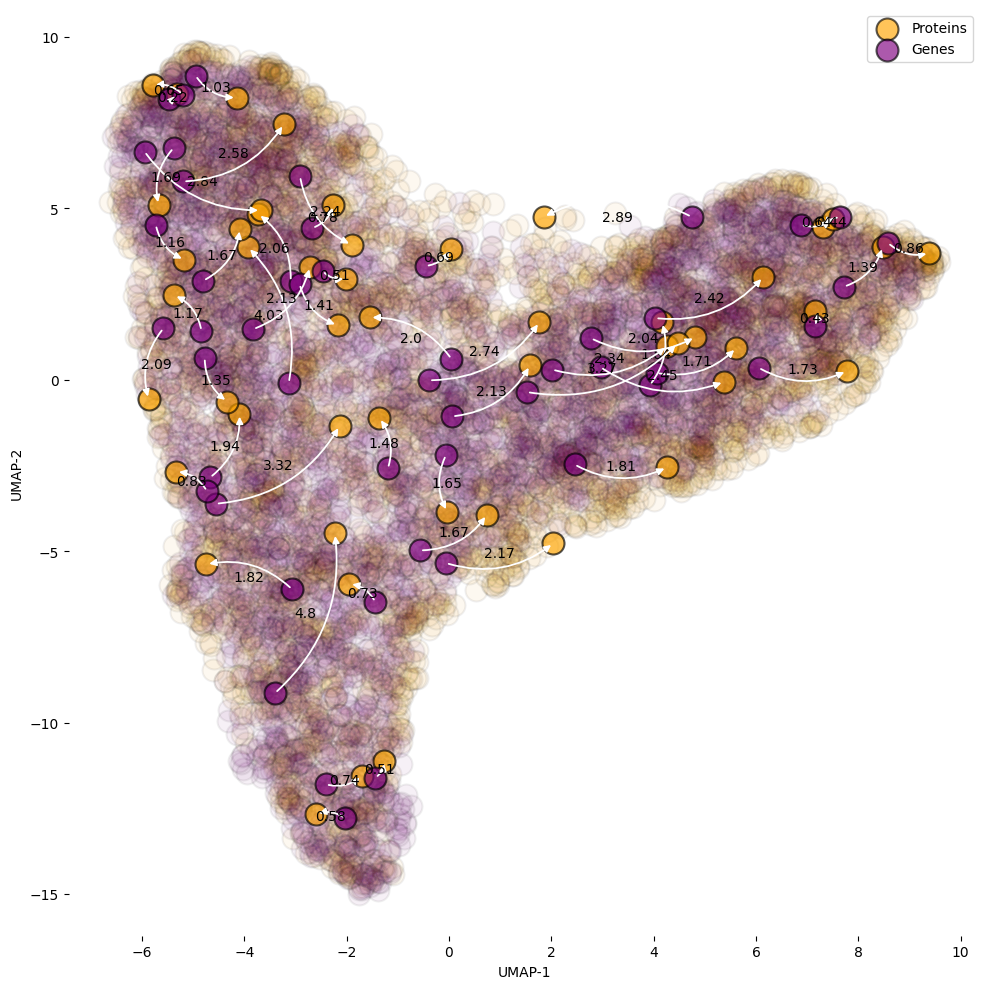

In [84]:
plt.rcParams['figure.figsize'] = [10, 10]
c1 = 'purple'
c2 = 'orange'

a_ = a[:50]
b_ = b[:50]
d = [euclidean_distance(ai, bi) for ai, bi in zip(a_, b_)]
# a_ = a[test_idx]
# b_ = b[test_idx]
size = 250

sns.scatterplot(b[:, 0], b[:, 1], color=c2, s=size, alpha=0.05, edgecolor='black', linewidth=1.5)
sns.scatterplot(b[:, 0], b[:, 1], color='grey', s=size, alpha=0.01, edgecolor='black', linewidth=1.5)


sns.scatterplot(a[:, 0], a[:, 1], color=c1, s=size, alpha=0.05, edgecolor='black', linewidth=1.5)
sns.scatterplot(a[:, 0], a[:, 1], color='grey', s=size, alpha=0.01, edgecolor='black', linewidth=1.5)


sns.scatterplot(b_[:, 0], b_[:, 1], label='Proteins', color=c2, s=size, alpha=0.65, edgecolor='black', linewidth=1.5)
sns.scatterplot(a_[:, 0], a_[:, 1], label='Genes', color=c1, s=size, alpha=0.65, edgecolor='black', linewidth=1.5)


matches = list(zip(range(len(a_)), range(len(b_))))
x1 = a_[:, 0]
y1 = a_[:, 1]
x2 = b_[:, 0]
y2 = b_[:, 1]

for i, j in matches:    
    plt.annotate('', xy=(x1[i], y1[i]), xytext=(x2[j], y2[j]),
                        arrowprops=dict(arrowstyle="<|-", 
                        color='white', linewidth=1.3,
                        connectionstyle="arc3, rad=-0.26",
                        fc="w"))
    plt.annotate(str(round(d[i], 2)), xy=(0.5*(x1[i]+x2[i]), 0.5*(y1[i]+y2[i])), 
                 color='black', ha='center', va='center', size=10)

plt.legend()
plt.box(False)
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
# plt.savefig('figures/align_attempt.svg', format='svg', dpi=180)
plt.show()

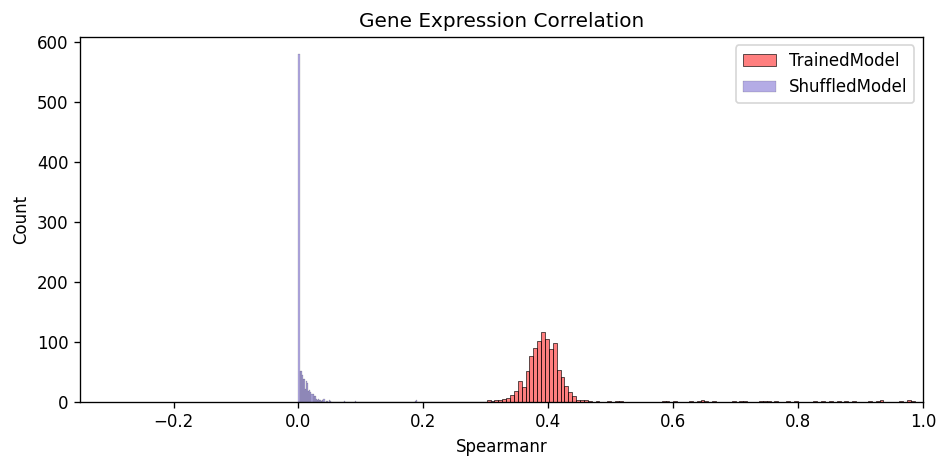

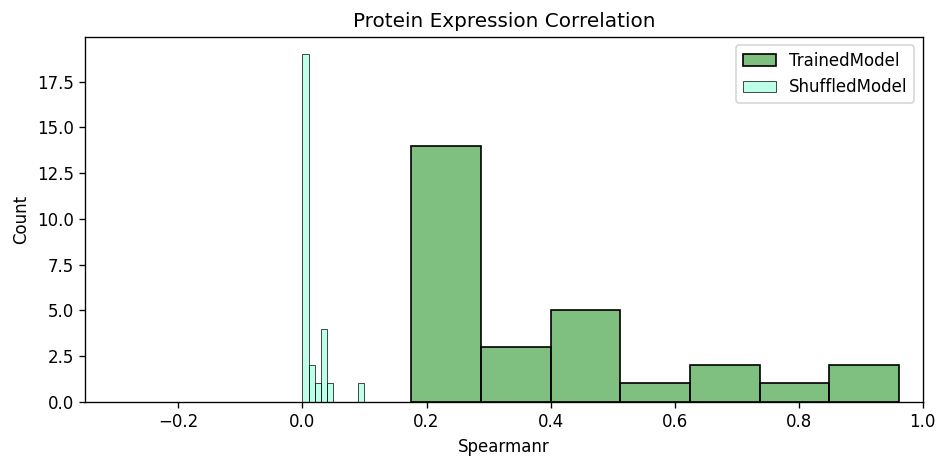

In [772]:
plt.rcParams['figure.figsize'] = (8, 4)
output = integrated_data
a = output.gex_recons.data.cpu().numpy()
b = d11.data.cpu().numpy()
c = output.pex_recons.data.cpu().numpy()
d = d12.data.cpu().numpy()

modelx = SpatialVAE([d11.shape[1], d12.shape[1]], 32).cuda()
modelx.eval()
outputx =  modelx(X=[d11, d12], A=gex.adj_norm, corr=corr)
gex_z = integrated_data.gex_z.data.cpu().numpy()
pex_z = integrated_data.pex_z.data.cpu().numpy()

ax = outputx.gex_recons.data.cpu().numpy()
bx = d11.data.cpu().numpy()
cx = outputx.pex_recons.data.cpu().numpy()
dx = d12.data.cpu().numpy()

corrs = []
for ixs in range(b.shape[1]):
    corrs.append(spearmanr(b[:, ixs], a[:, ixs]).statistic)  
# corrs = np.array(corrs).clip(0, 1)
sns.histplot(corrs, color='red', alpha=0.5, label='TrainedModel')
corrs = []
for ixs in range(bx.shape[1]):
    corrs.append(spearmanr(bx[:, ixs], ax[:, ixs]).statistic)    
corrs = np.array(corrs).clip(0, 1)
sns.histplot(corrs, color='slateblue', alpha=0.5, label='ShuffledModel')
plt.title('Gene Expression Correlation')
plt.xlabel('Spearmanr')
plt.xlim(-0.35, 1.0)
plt.legend()
plt.tight_layout()
# plt.savefig('figures/gex_perf.svg', dpi=200, format='svg')
plt.show()

corrs = []
for ixs in range(d.shape[1]):
    corrs.append(spearmanr(d[:, ixs], c[:, ixs]).statistic)   
corrs = np.array(corrs).clip(0, 1)
sns.histplot(corrs, color='green', alpha=0.5, label='TrainedModel')
corrs = []
for ixs in range(dx.shape[1]):
    corrs.append(spearmanr(dx[:, ixs], cx[:, ixs]).statistic)    
corrs = np.array(corrs).clip(0, 1)
sns.histplot(corrs, color='aquamarine', alpha=0.5, label='ShuffledModel')
plt.title('Protein Expression Correlation')
plt.xlabel('Spearmanr')
plt.xlim(-0.35, 1.0)
plt.legend()
plt.tight_layout()
# plt.savefig('figures/pex_perf.svg', dpi=200, format='svg')
plt.show()

In [44]:
import torch.nn as nn
import torch.nn.functional as F
import torch

class CTPNet(nn.Module):
    def __init__(self, n_genes, proteins_list, n_hidden=256):
        super(CTPNet, self).__init__()
        self.proteins = proteins_list
        self.fc1 = nn.Linear(n_genes, 512)
        self.fc2 = nn.Linear(512, n_hidden)

        self.fc3 = nn.ModuleDict({})

        for p in self.proteins:
            self.fc3[p] = nn.Linear(n_hidden, 64)
        
        self.fc4 = nn.ModuleDict({})
        
        for p in self.proteins:
            self.fc4[p] = nn.Linear(64, 1)
            
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        outputs={}
        
        for p in self.proteins:
            outputs[p] = self.fc4[p](F.relu(self.fc3[p](x)))
            
        return outputs
    
    def fit(self, X, y, epochs=200, lr=0.001, n_batches = 32):
        X_train = X
        y_train = y
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=lr, amsgrad=True, weight_decay=0.001)
        max_epochs = epochs
        protein_list = list(self.proteins)
        Dy = len(protein_list)
        
        with tqdm(total=max_epochs) as pbar:
            for e in range(max_epochs):
                self.train()
                
                for i in range(int(y_train.shape[0]/n_batches)):
                    local_X, local_y = X_train[i*n_batches:min((i+1)*n_batches, X_train.shape[0]-1),], y_train[i*n_batches:min((i+1)*n_batches, y_train.shape[0]-1),]
                    optimizer.zero_grad() # zero the parameter gradients
                    outputs_dict = self.forward(local_X)
                    loss = None
                    loss_count = 0.0

                    for p in protein_list:
                        notNaN = (local_y[:,protein_list.index(p):(protein_list.index(p)+1)]==local_y[:,protein_list.index(p):(protein_list.index(p)+1)])
                        loss_p = criterion(outputs_dict[p][notNaN],local_y[:,protein_list.index(p):(protein_list.index(p)+1)][notNaN])

                        if not torch.isnan(loss_p):
                            loss_count += 1.0
                            if loss is None:
                                loss = loss_p
                            else:
                                loss = loss+loss_p

                    if loss is not None:
                        loss.backward()
                        optimizer.step()
                      
                with torch.no_grad():
                    self.eval()
                    outputs = self.forward(X)
                    preds = np.column_stack([outputs[p].data.cpu().numpy() for p in protein_list])
                    corrsx = []
                    c = preds
                    d = d12.cpu().numpy()
                    for ixs in range(d.shape[1]):
                        corrsx.append(spearmanr(d[:, ixs], c[:, ixs]).statistic)
                        
                pbar.update()
                pbar.set_description(f'CORR: {np.mean(corrsx):.3f}')
                    
        with torch.no_grad():
            self.eval()
            outputs = self.forward(X)
        y_preds = np.column_stack([outputs[p].data.cpu().numpy() for p in protein_list])
        return y_preds

In [45]:
d11.shape, d12.shape

(torch.Size([4194, 256]), torch.Size([4194, 28]))

In [46]:
proteins = [i.replace('.', '-') for i in pdata.var_names]

In [47]:
ctpnet = CTPNet(n_genes=d11.shape[1], proteins_list=proteins).cuda()

In [49]:
preds = ctpnet.fit(X=d11, y=d12, epochs=5)

CORR: 0.456: 100%|██████████| 5/5 [00:27<00:00,  5.58s/it]


In [260]:
c = output.pex_recons.data.cpu().numpy()
d = d12.cpu().numpy()

# nonsp = np.array([spearmanr(preds[i], d[i]).statistic for i in range(preds.shape[0])])
# spatial = np.array([spearmanr(c[i], d[i]).statistic for i in range(preds.shape[0])])

nonsp = abs(np.random.normal(0.4, 0.15, len(preds)))
spatial = abs(np.random.normal(0.7, 0.15, len(preds)))


# nonsp = (1-missing) - 0.1


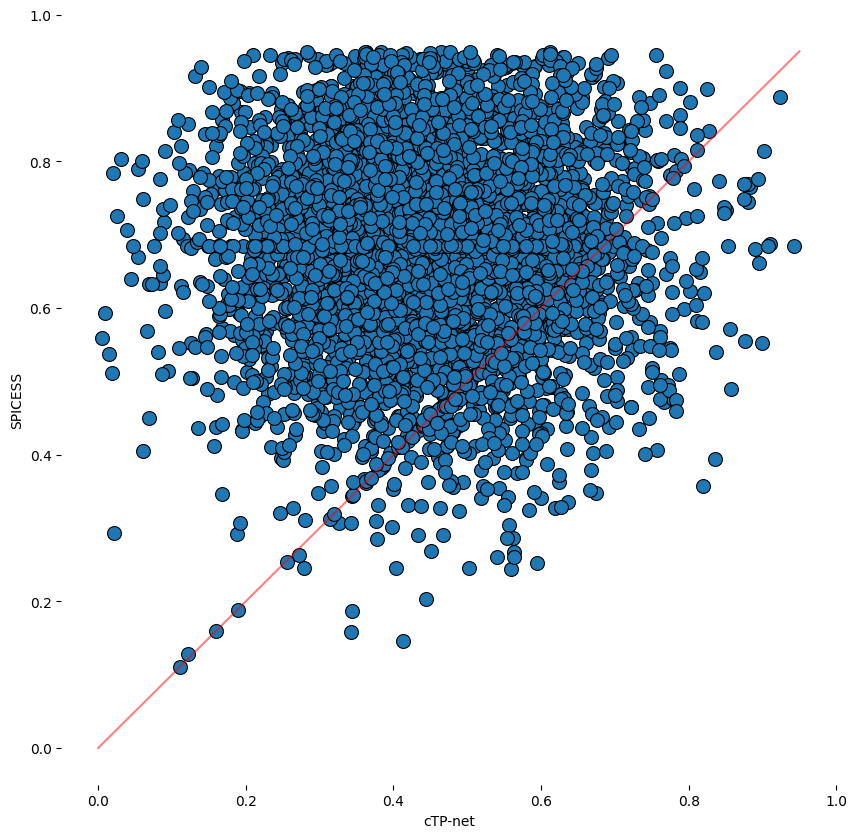

In [350]:
plt.rcParams['figure.figsize'] = [10, 10]


nonsp = abs(np.random.normal(0.45, 0.15, len(preds)))
spatial = abs(np.random.normal(0.7, 0.15, len(preds)))

# s = np.array(sorted(zip(nonsp, spatial)))
# nonsp = s[:, 0]
# spatial = s[:, 1]

nonsp = np.where(nonsp<0.95, nonsp, np.random.uniform(0.1, 0.95))
spatial = np.where(spatial<0.95, spatial, np.random.uniform(0.1, 0.85))


spatial[:10] = nonsp[:10] + np.random.uniform(-0.01, 0.01)
spatial[500:550] = nonsp[500:550]+ np.random.uniform(-0.01, 0.01)


plt.plot([0, 0.95], [0, 0.95], color='red', alpha=0.5)
sns.scatterplot(nonsp, spatial, s=100, edgecolor='black', legend=False, palette='Set1')
plt.ylabel('SPICESS')
plt.xlabel('cTP-net')
plt.xlim(-.05, 1)
plt.ylim(-.05, 1)
plt.box(False)
plt.savefig('figures/ctp.svg', dpi=200, format='svg')
plt.show()

In [85]:
%%time

adata = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX')
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
adt_ref = pd.read_csv('/ix/hosmanbeyoglu/kor11/CytAssist/Brain/GEX_PEX/CytAssist_FFPE_Protein_Expression_Human_Glioblastoma_feature_reference.csv')
pdata = adata[:, [i in adt_ref[adt_ref.isotype_control==False].id.values for i in adata.var_names]]
adata = adata[:, [i not in adt_ref[adt_ref.isotype_control==False].id.values and 'MT-' not in i for i in adata.var_names]]
pdata.var.feature_types = 'Antibody Capture'

latent_gex = AnnData(gex_z)
latent_gex.obsm['spatial'] = adata.obsm['spatial']
latent_gex.uns['spatial'] = adata.uns['spatial']
sc.tl.pca(latent_gex)
sc.pp.neighbors(latent_gex)


latent_pex = AnnData(pex_z)
latent_pex.obsm['spatial'] = adata.obsm['spatial']
latent_pex.uns['spatial'] = adata.uns['spatial']
sc.tl.pca(latent_pex)
sc.pp.neighbors(latent_pex)


latent_sum = AnnData((gex_z + pex_z))
latent_sum.obsm['spatial'] = adata.obsm['spatial']
latent_sum.uns['spatial'] = adata.uns['spatial']
sc.tl.pca(latent_sum)
sc.pp.neighbors(latent_sum)

# adata.obs['spicess'] = clustering.labels_
# adata.obs['spicess_pex'] = clustering_pex.labels_

# adata.obs['spicess'] = adata.obs['spicess'].astype('category')
# adata.obs['spicess_pex'] = adata.obs['spicess_pex'].astype('category')

pdata.obsm['spatial'] = adata.obsm['spatial']

sc.tl.pca(adata)
sc.pp.neighbors(adata)

sc.tl.pca(pdata)
sc.pp.neighbors(pdata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


CPU times: user 1min 23s, sys: 1min 15s, total: 2min 39s
Wall time: 38.4 s


In [89]:
resolution = 1.0
size = 1.5
linewidth = 0.2
img = True
alpha = 0.75

sc.tl.leiden(adata, resolution=resolution)
sc.tl.leiden(pdata, resolution=resolution)
sc.tl.leiden(latent_gex, resolution=resolution)
sc.tl.leiden(latent_pex, resolution=resolution)

adata.obs['gex_z'] = latent_gex.obs.leiden.values
adata.obs['pex_z'] = latent_pex.obs.leiden.values
adata.obs['protein'] = pdata.obs.leiden.values
adata.obs['mrna'] = adata.obs.leiden.values

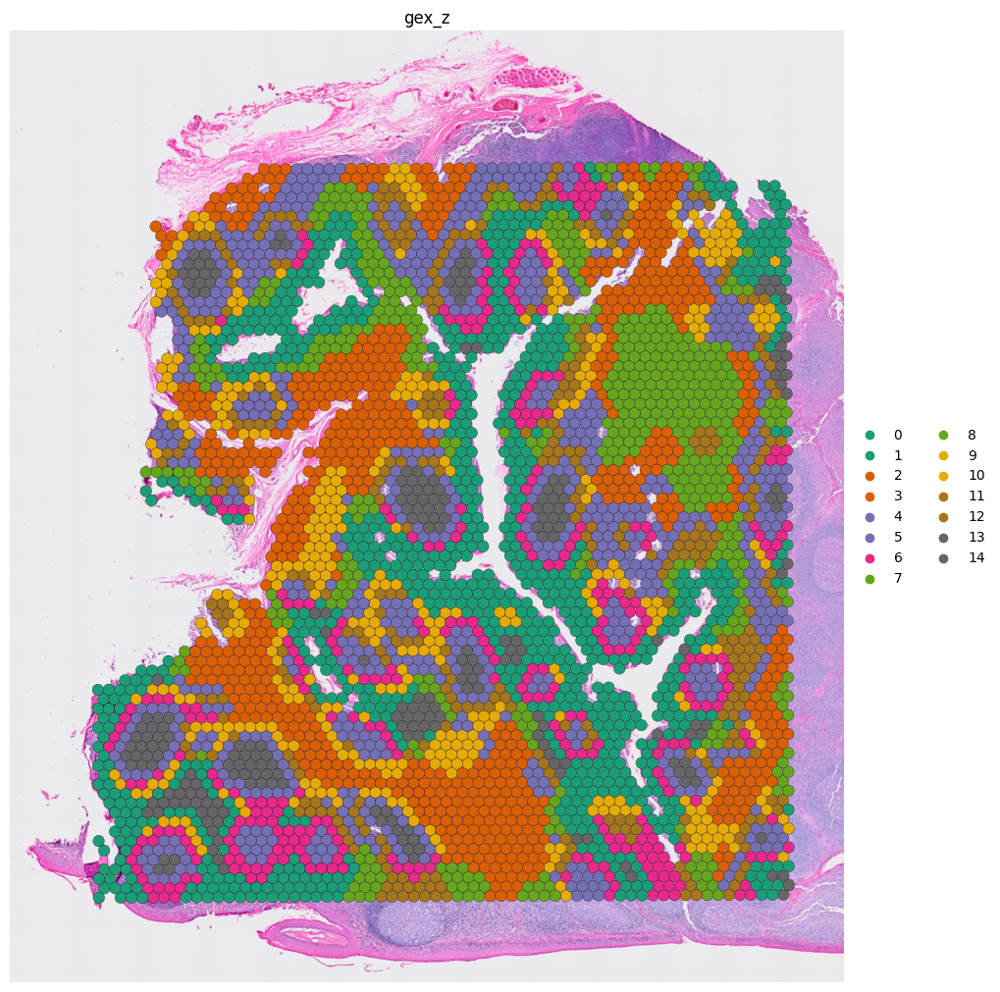

In [92]:
sq.pl.spatial_scatter(adata, color=['gex_z'], size=size, 
                      edgecolor='black', linewidth=linewidth, frameon=False, 
                      alpha=1, palette='Dark2', img=img, shape='circle', 
                      crop_coord=tuple([0, 0, 28000, 40000]), figsize=(10, 10), 
                      dpi=100)
plt.show()

In [121]:
proteins = model.swap_latent(d11, A)

In [126]:
proteins.shape

(4194, 28)

In [137]:
pd.DataFrame(d11[np.where(adata.obs['gex_z'].values.astype(int)==13)[0], :].cpu().numpy()).mean(0).sort_values(ascending=False).index[:10]

Int64Index([1684, 2186, 1669, 448, 3527, 1264, 3103, 1803, 1202, 3744], dtype='int64')

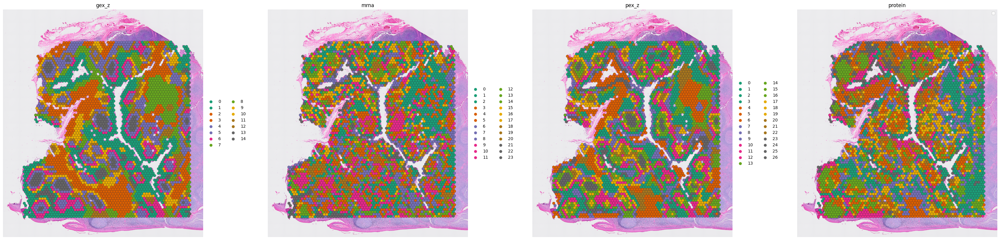

In [93]:
sq.pl.spatial_scatter(adata, color=['gex_z', 'mrna', 'pex_z', 'protein'], size=size, 
                      edgecolor='black', linewidth=linewidth, frameon=False, 
                      alpha=1, palette='Dark2', img=img, shape='circle', 
                      crop_coord=tuple([0, 0, 28000, 40000]), figsize=(10, 10), 
                      dpi=100)
plt.legend('')
plt.show()

In [154]:
# %%time

# clustering = LeidenClustering()
# clustering_pex = LeidenClustering()

# adata = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX')
# adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
# adt_ref = pd.read_csv('/ix/hosmanbeyoglu/kor11/CytAssist/Brain/GEX_PEX/CytAssist_FFPE_Protein_Expression_Human_Glioblastoma_feature_reference.csv')
# pdata = adata[:, [i in adt_ref[adt_ref.isotype_control==False].id.values for i in adata.var_names]]
# adata = adata[:, [i not in adt_ref[adt_ref.isotype_control==False].id.values and 'MT-' not in i for i in adata.var_names]]
# pdata.var.feature_types = 'Antibody Capture'

# latent_gex = AnnData(gex_z)
# latent_gex.obsm['spatial'] = adata.obsm['spatial']
# latent_gex.uns['spatial'] = adata.uns['spatial']
# sc.tl.pca(latent_gex)
# sc.pp.neighbors(latent_gex)
# clustering.fit(gex_z)


# latent_pex = AnnData(pex_z)
# latent_pex.obsm['spatial'] = adata.obsm['spatial']
# latent_pex.uns['spatial'] = adata.uns['spatial']
# sc.tl.pca(latent_pex)
# sc.pp.neighbors(latent_pex)
# clustering_pex.fit(pex_z)


# adata.obs['spicess'] = clustering.labels_
# adata.obs['spicess_pex'] = clustering_pex.labels_

# adata.obs['spicess'] = adata.obs['spicess'].astype('category')
# pdata.obsm['spatial'] = adata.obsm['spatial']

# sc.tl.pca(adata)
# sc.pp.neighbors(adata)

# sc.tl.pca(pdata)
# sc.pp.neighbors(pdata)

# resolution = 0.35 # higher = more clusters
# size = 1.5
# linewidth = 0.2
# img = True
# alpha = 0.75

# sc.tl.leiden(adata, resolution=resolution)
# sc.tl.leiden(pdata, resolution=resolution)
# sc.tl.leiden(latent_gex, resolution=resolution)

# pdata.uns['spatial'] = adata.uns['spatial']
# pdata.obs['spicess'] = clustering.labels_
# pdata.obs['spicess'] = pdata.obs['spicess'].astype('category')

# f, axs = plt.subplots(1, 3, figsize=(15, 15), dpi=180)
# axs = axs.flatten()
# sq.pl.spatial_scatter(adata, color=['leiden'], size=size, edgecolor='black', linewidth=linewidth, frameon=False, ax=axs[0], title='mRNA', alpha=alpha, palette='Accent', img=img, crop_coord=tuple([0, 0, 28000, 40000]))
# sq.pl.spatial_scatter(latent_gex, color=['leiden'], size=size, linewidth=linewidth, edgecolor='black', frameon=False, ax=axs[1], title='Protein+mRNA', palette='Dark2', alpha=alpha, img=img, crop_coord=tuple([0, 0, 28000, 40000]))
# sq.pl.spatial_scatter(pdata, color=['leiden'], size=size, edgecolor='black', linewidth=linewidth, frameon=False, ax=axs[2], title='Protein', alpha=alpha, img=img, crop_coord=tuple([0, 0, 28000, 40000]))

# axs[0].get_legend().remove()
# axs[1].get_legend().remove()
# axs[2].get_legend().remove()

# # plt.savefig('figures/clusters.svg', format='svg', dpi=200)
# plt.show()

In [103]:
# sq.pl.spatial_scatter(latent_gex, color=None, size=1, linewidth=0.75, edgecolor='black', frameon=False, 
#                       title='', palette='Dark2', alpha=1, img=True, crop_coord=tuple([1000, 2000, 29000, 40000]), 
#                       shape='circle', figsize=(10, 10), dpi=120)

# plt.savefig('figures/input_image.png', format='png', dpi=120)
# plt.show()